# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>

## Кластеризация

Как мы выяснили на <a href="https://miptstats.github.io/courses/ad_fivt/lecture8.pdf">лекции</a>, задача кластеризации имеет множество разных особенностей, например, интерпретация, неоднозначность, оценка качества. В данном ноутбуке мы рассмотрим несколько примеров кластеризации методами из библиотеки <a target="_blank" href="https://scikit-learn.org/">Scikit-Learn</a>. В качестве данных рассмотрим как искусственные данные, так и реальные &mdash; ответы на вопросы в боте. Будем также пользоваться понижением размерности, о которых можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/pca.html" target="_blank">предыдущем ноутбуке</a>, а так же методами обработки естественного языка, о которых можно почитать в прошлой <a href="https://miptstats.github.io/courses/ad_fivt/lecture6.pdf">лекции</a> и <a href="https://miptstats.github.io/courses/ad_fivt/nlp_sem.html" target="_blank">семинаре</a>.

In [1]:
import os
import json
import numpy as np
import pandas as pd
import scipy.stats as sps
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
import plotly.express as px

import sklearn.datasets
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture

sns.set_theme(style="darkgrid", palette="Set2")
pio.renderers.default = "notebook"
pd.options.display.max_colwidth = 100

В данном ноутбуке сравним различные способы кластеризации данных:
- <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html">KMeans</a>
- <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html">EM-алгоритм</a>
- <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html">DBSCAN</a>

Вначале все методы будем применять на искусственном датасете из 4 кластеров. Поэтому начнем с генерации этого датасета:

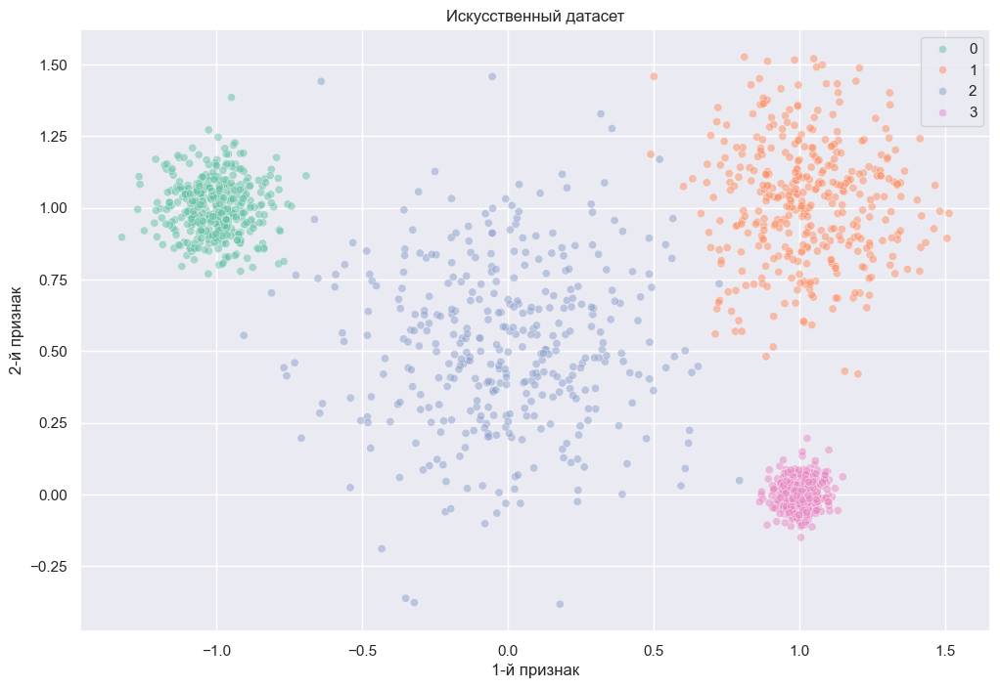

In [2]:
n_samples = 1500

# Генерация данных
data, clusters = sklearn.datasets.make_blobs(
    n_samples=n_samples,
    centers=[[-1, 1], [1, 1], [0, 0.5], [1, 0]],
    cluster_std=[0.1, 0.2, 0.3, 0.05],
    random_state=42,
)

# Визуализация
plt.figure(figsize=(12, 8))
sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=clusters, alpha=0.5, palette="Set2")

plt.title("Искусственный датасет")
plt.xlabel("1-й признак")
plt.ylabel("2-й признак")
plt.show()

### 1. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html">KMeans</a>

K-Means – это метод машинного обучения без учителя (unsupervised learning), который используется для группировки данных на заранее заданное число кластеров. 

Вспомним вкратце схему работы:
1. **Инициализация.** Сначала метод случайным образом выбирает центры для требуемого числа кластеров.
2. **Выбор кластера.** Каждый элемент датасета присваивается к ближайшему центру кластера по некоторой метрике расстояния (обычно Евклидово расстояние).
3. **Пересчет центров.** Вычисляются новые центры для кластеров, как центр масс всех точек, принадлежащих кластеру.
4. Шаги 2 и 3 повторяются до тех пор, пока кластеры не перестанут меняться или не будет достигнуто максимальное количество итераций.

Таким образом мы получим кластеризацию данных, при которой элементы внутри одного кластера похожи друг на друга, а разные кластеры отличимы друг от друга.


#### Реализация KMeans из sklearn

`KMeans(n_clusters=8, init='k-means++', n_init=10, max_iter=300, tol=0.0001, precompute_distances='auto', verbose=0, random_state=None, copy_x=True, n_jobs=None, algorithm='auto')`  

*Самый важный параметр*  
* `n_clusters` &mdash; число кластеров.

*Наиболее важные остальные параметры*   
* `init` &mdash; метод для начального определения центров кластеров. По дефолту используется `k-means++`. Подробнее про этот метод можно найти <a target="_blank" href="https://ru.wikipedia.org/wiki/K-means%2B%2B">здесь</a>.   
* `n_init` &mdash; количество запусков KMeans из различных начальных приближений.
* `max_iter` &mdash; максимальное количество итераций.  
* `tol`  &mdash; максимальное  относительное отличие в метрике, при котором можно сказать, что метод сошелся. 
* `verbose` &mdash; позволяет отображать работу метода на промежуточных шагах с определенной переодичностью. Может пригодится работы с очень большими данными.  
* `random_state` &mdash; позволяет зафиксировать случайность.  
* `n_jobs` &mdash; позволяет распараллелить вычисления на `n_jobs` задач. Может пригодится работы с очень большими данными.  

*Методы*
* `fit(self, X[, y, sample_weight])` &mdash; обучиться на данных `X`.
* `predict(self, X[, sample_weight])` &mdash; вернуть номера кластеров для каждого элемента `X`.
* `fit_predict(self, X[, y, sample_weight])` &mdash; обучиться на данных `X` и вернуть номера кластеров.

*Наиболее важные атрибуты*  
* `cluster_centers_` &mdash; центры кластеров.  
* `labels_` &mdash; метки для данных.
* `inertia_` &mdash; расстояния от точек до центров кластеров.

---

Пошагово посмотрим как сходится k-means. Для этого будем использовать собственоручно написанный k-means, так как из реализации в sklearn тяжело вытаскивать промежуточные шаги

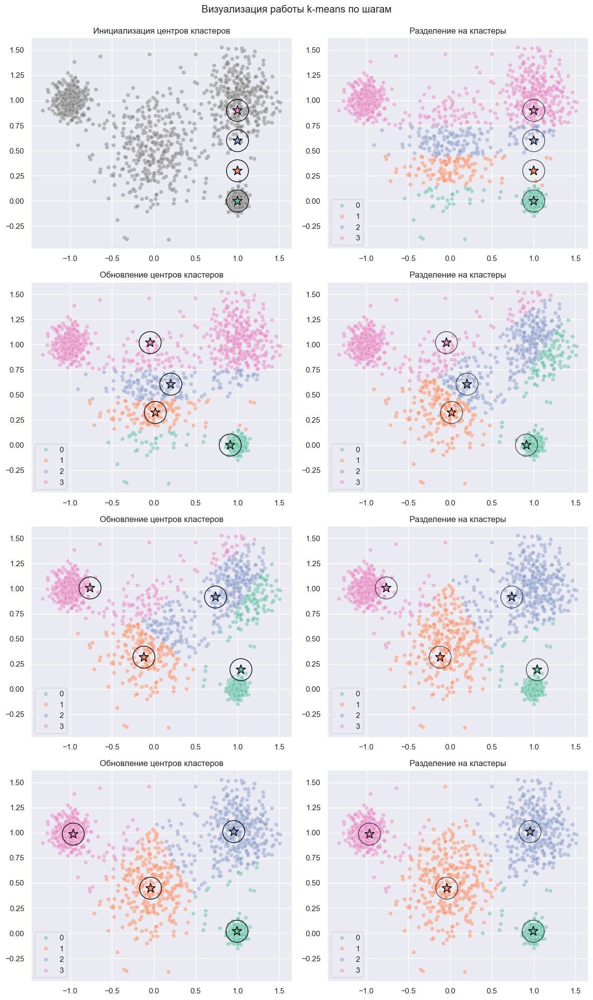

In [3]:
plt.figure(figsize=(12, 20))
plt.suptitle("Визуализация работы k-means по шагам", y=0.995)

# Начальные значения
centres = np.array([[1, 0.0], [1, 0.3], [1, 0.6], [1, 0.9]])
n_clusters = len(centres)
y_pred = None

for n in range(1, n_clusters + 1):
    plt.subplot(4, 2, n * 2 - 1)

    if n == 1:
        plt.title("Инициализация центров кластеров")
        sns.scatterplot(x=data[:, 0], y=data[:, 1], c="gray", alpha=0.5)
    else:
        plt.title("Обновление центров кластеров")
        sns.scatterplot(
            x=data[:, 0], y=data[:, 1], hue=y_pred, alpha=0.5, palette="Set2"
        )
    sns.scatterplot(
        x=centres[:, 0],
        y=centres[:, 1],
        hue=np.arange(n_clusters),
        marker="*",
        s=200,
        edgecolors="black",
        palette="Set2",
        legend=False,
    )
    sns.scatterplot(
        x=centres[:, 0],
        y=centres[:, 1],
        s=1000,
        edgecolors="black",
        facecolor="none",
        linewidths=1,
    )

    # Предсказание
    y_pred = np.argmin(
        [np.sum((data - centres[j]) ** 2, axis=1) for j in range(n_clusters)], axis=0
    )

    plt.subplot(4, 2, n * 2)

    plt.title("Разделение на кластеры")
    sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=y_pred, alpha=0.5, palette="Set2")
    sns.scatterplot(
        x=centres[:, 0],
        y=centres[:, 1],
        hue=np.arange(n_clusters),
        marker="*",
        s=200,
        edgecolors="black",
        palette="Set2",
        legend=False,
    )
    sns.scatterplot(
        x=centres[:, 0],
        y=centres[:, 1],
        alpha=0.7,
        s=1000,
        edgecolors="black",
        facecolor="none",
        linewidths=1,
    )

    # Переопределение центров кластеров
    centres = np.array(
        list(np.mean(data[y_pred == j], axis=0) for j in range(n_clusters))
    )

plt.tight_layout()
plt.show()

Больше примеров визуализации работы k-means можно найти <a target="_blank" href="https://www.naftaliharris.com/blog/visualizing-k-means-clustering/">здесь</a>.

Попробуем применить k-means для разного числа кластеров.

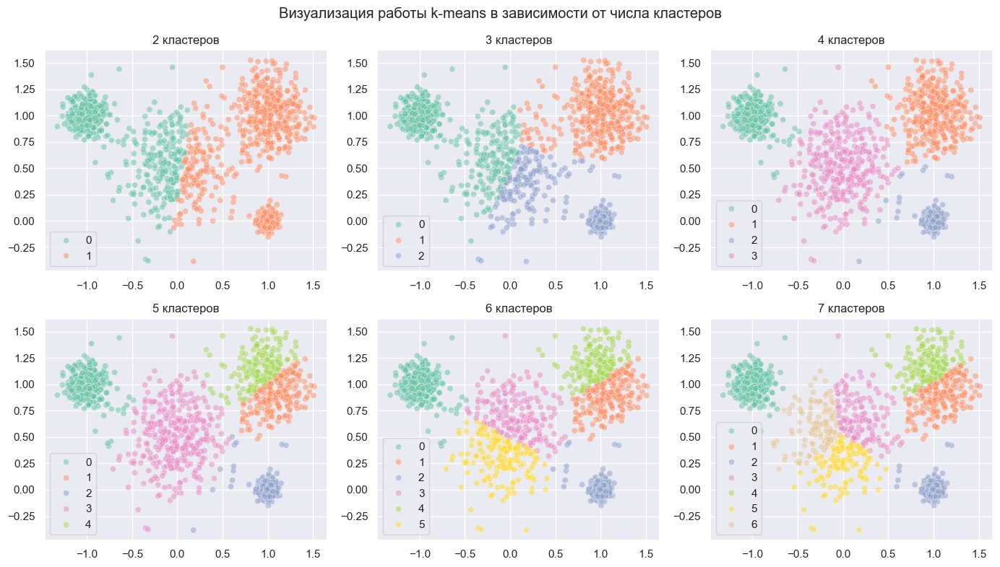

In [4]:
fig = plt.figure(figsize=(14, 8))
fig.suptitle("Визуализация работы k-means в зависимости от числа кластеров")

for n in range(2, 8):
    # Предсказание
    kmeans = KMeans(n_clusters=n, n_init="auto", random_state=42)
    kmeans.fit(data)
    y_pred = kmeans.predict(data)

    # Визуализация
    plt.subplot(2, 3, n - 1)
    sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=y_pred, alpha=0.5, palette="Set2")
    plt.title(f"{n} кластеров")

plt.tight_layout()
plt.show()

Видно, что у KMeans есть проблемы, если кластеры имеют разный разброс. Например, в данном случае к самому компактному синему кластеру также отнеслись точки от двух соседних кластеров.

### 2. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html">EM-алгоритм</a>

EM-алгоритм (Expectation-Maximization) &mdash; в общем случае мощный подход для нахождения оценок в моделях с ненаблюдаемыми латентными величинами. В случае кластеризации, рассматривается частный случай метода, предполагая, что распределения данных является смесью нормальных (гауссовых) распределений, то есть плотность равна взвешенной плотности нескольких нормальных величин. Именно поэтому в sklearn этот метод назван `GaussianMixture`.

Вспомним основные шаги:
1. **Инициализация.** Выбираются начальные значения параметров кластеров (например, с использованием k-means).
2. **E-шаг (Expectation).** На основе текущих параметров распределений оцениваем вероятности принадлежности объектов выборки к кластерам.
3. **M-шаг (Maximization).** Используя вероятности, полученные на предыдущем шаге, оцениваем параметры модели (средние и ковариации нормальных распределений).
4. Шаги E и M повторяются пока метод не сойдется.


#### Реализация EM-алгоритма из sklearn

`GaussianMixture(n_components=1, covariance_type='full', n_init=1, max_iter=100, tol=0.001, init_params='kmeans', random_state=None, verbose=0)`  

*Самый важный параметр*  
* `n_components` &mdash; число кластеров.

*Наиболее важные остальные параметры*   
* `covariance_type` &mdash; тип матрицы ковариаций, дефолтное значение `full` означает, что для каждого кластера будет своя произвольная матрица;
* `init_params` &mdash; метод для начального определения центров кластеров. По дефолту используется `k-means`, то есть кластеры инициализируются с помощью обычного k-means;
* `n_init` &mdash; количество запусков EM-алгоритма из различных начальных приближений;
* `max_iter` &mdash; максимальное количество итераций;
* `tol`  &mdash; максимальное  относительное отличие в метрике, при котором можно сказать, что метод сошелся; 
* `verbose` &mdash; позволяет отображать работу метода на промежуточных шагах с определенной переодичностью. Может пригодится работы с очень большими данными.  
* `random_state` &mdash; позволяет зафиксировать случайность.

*Методы*  
* `fit(self, X[, y, sample_weight])` &mdash; обучиться на данных `X`;
* `predict(self, X[, sample_weight])` &mdash; вернуть номера кластеров для каждого элемента `X`;
* `fit_predict(self, X[, y, sample_weight])` &mdash; обучиться на данных `X` и вернуть номера кластеров.

*Наиболее важные атрибуты*  
* `means_` &mdash; центры кластеров;
* `covariances_` &mdash; разброс кластеров (оценка матриц ковариаций).


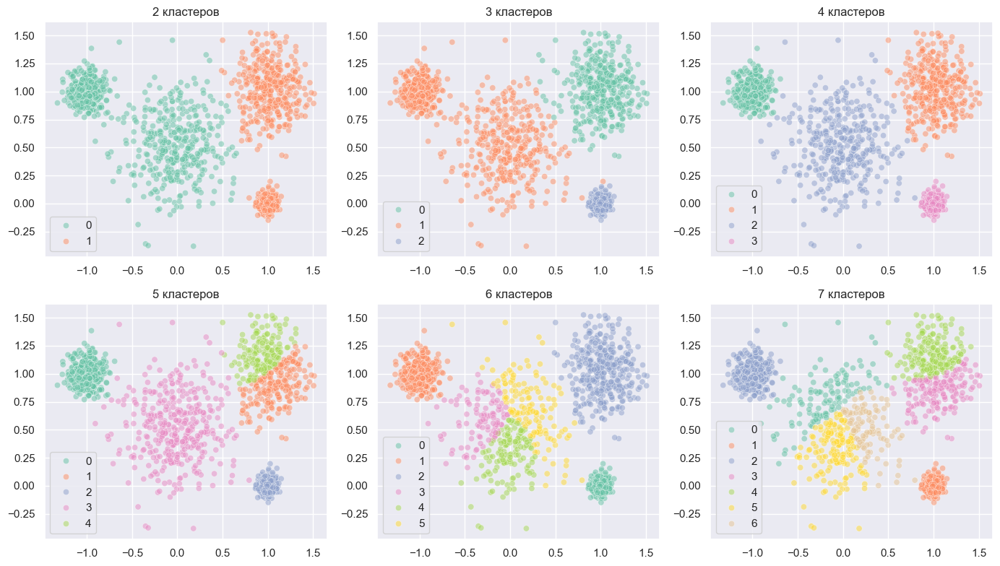

In [5]:
plt.figure(figsize=(14, 8))
fig.suptitle("Визуализация работы EM-алгоритма в зависимости от чила кластеров")

for n in range(2, 8):
    # Предсказание
    em_algo = GaussianMixture(n_components=n, n_init=10, random_state=42)
    em_algo.fit(data)
    y_pred = em_algo.predict(data)

    # Визуализация
    plt.subplot(2, 3, n - 1)
    sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=y_pred, alpha=0.5, palette="Set2")
    plt.title(f"{n} кластеров")

plt.tight_layout()
plt.show()

Видим, что для четырех кластеров получилось почти идеальное разделение. Поскольку теперь модель выучивает свою дисперсию для каждого кластера, решилась проблема с разным разбросом в разных кластерах, возникающая в k-means. 

### 3. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html">DBSCAN</a>

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) &mdash; еще один метод кластеризации, основанный на плотности точек. Он позволяет выявить кластеры произвольной формы и обнаружить выбросы (шум в данных). В отличие от K-Means и EM-алгоритма, DBSCAN не требует заранее заданного числа кластеров и устойчив к выбросам, однако часто требует нетривиальный подбор двух основных параметров `eps` и `min_samples`.

Вспомним схему работы DBSCAN:
1. **Определение соседей.** Для каждой точки метод ищет соседние точки, расстояние до которых меньше заданного порога `eps`. 
2. **Классификация точек.** Точки классифицируются как внутренние, если в их окрестности `eps` находится как минимум `min_samples` других точек. Точки, которые не удовлетворяют этому критерию, и не находятся рядом с внутренними точками, помечаются как выбросы.
3. **Формирование кластеров.** Все внутренние точки, которые связаны друг с другом через соседей, группируются в кластеры. Точки, непосредственно достижимые из внутренних точек, но имеющие меньше соседей, чем `min_samples`, называются граничными и также включаются в кластер.

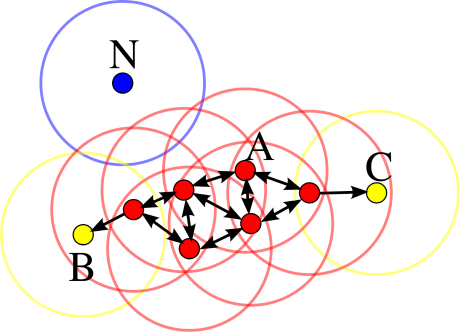

На рисунке отмечены типы точек:
   * красные точки &mdash; внутренние,
   * желтые точки &mdash; граничные,
   * синие точки &mdash; выбросы.  


Интерактивные примеры визуализации работы DBSCAN <a target="_blank" href="https://www.naftaliharris.com/blog/visualizing-dbscan-clustering/">здесь</a>.

---


#### Реализация DBSCAN из sklearn

`DBSCAN(eps=0.5, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)`  

*Самые важные параметры*
* `eps` &mdash; максимальное расстояние между двумя точками, которые можно считать соседями;
* `min_samples` &mdash; минимальное количество соседних точек, определяющих эту группу точек как внутренние.  

*Наиболее важные остальные параметры*
* `algorithm` &mdash; метод для поиска ближайших соседей;
* `n_jobs` &mdash; позволяет распараллелить вычисления на `n_jobs` задач. Может пригодится работы с очень большими данными.  

*Методы*  
* `fit(self, X[, y, sample_weight])` &mdash; обучиться на данных `X`;
* `fit_predict(self, X[, y, sample_weight])` &mdash; обучиться на данных `X` и вернуть номера кластеров.

*Наиболее важные атрибуты*
* `core_sample_indices_` &mdash; индексы внтуренних точек, определенных методом;
* `labels_` &mdash; лейблы точек, соответствующие предсказанным кластерам.

*Примечание.* 
Выбросы, детектированные методом, имеют лейбл `-1`.

---

Применим DBSCAN к нашим данным и визуализируем кластеризацию. На графике крупные точки являются внутренними, небольшие точки &mdash; граничные, черные &mdash; выбросы. Метод определил в данных 4 кластера и некоторое количество выбросов.

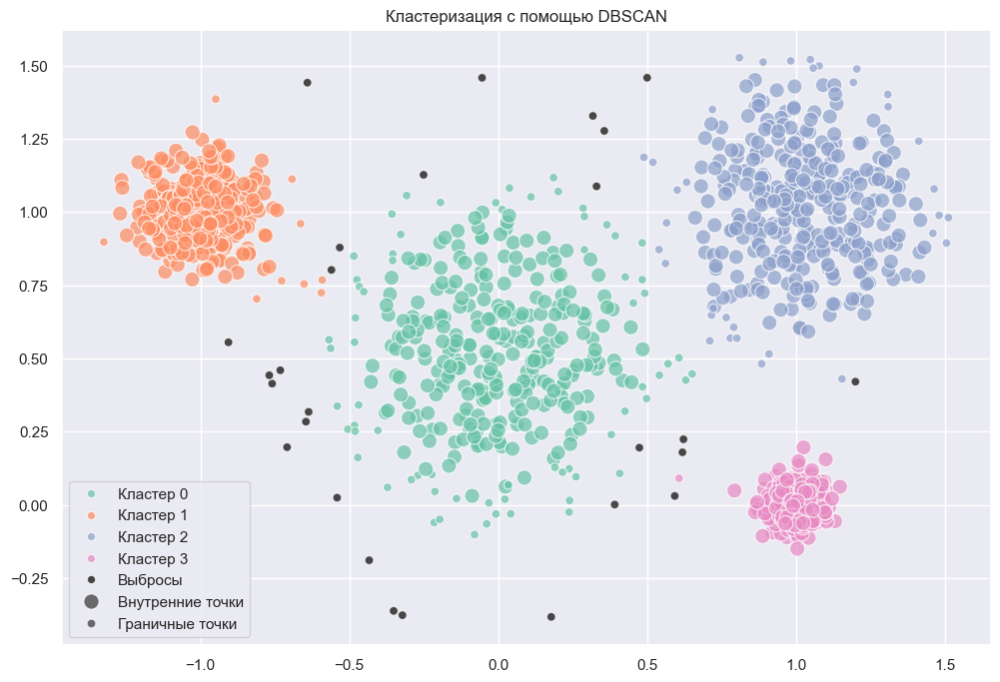

In [6]:
def visualize_dbscan_predicts(dbscan, legend="full", scale_sizes=1, title=None):
    """
    Визуализирует результаты DBSCAN, крупные точки - внутренние, небольшие - граничные, черные - выбросы

    :param dbscan: обученный DBSCAN
    :param legend: тип легенды из seaborn.scatterplot
    :param scale_sizes: коэффициент размера точек
    :param title: заголовок графика
    """
    # Делаем маску внутренних точек
    core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_samples_mask[dbscan.core_sample_indices_] = True

    # Достаем предсказанные кластеры
    labels = dbscan.labels_

    # Визуализируем
    if title is not None:
        plt.title(title)

    label_names = {-1: "Выбросы"} | {
        label: f"Кластер {label}" for label in set(labels) if label != -1
    }
    palette = {
        name: sns.palettes.color_palette("Set2")[label % 8]
        for label, name in label_names.items()
        if label != -1
    } | {"Выбросы": (0, 0, 0)}

    sns.scatterplot(
        x=data[:, 0],
        y=data[:, 1],
        hue=map(lambda l: label_names[l], labels),
        size=[
            "Внутренние точки" if is_core else "Граничные точки"
            for is_core in core_samples_mask
        ],
        sizes={
            "Внутренние точки": 30 * scale_sizes,
            "Граничные точки": 10 * scale_sizes,
        },
        palette=palette,
        alpha=0.7,
        legend=legend,
    )


# Обучаем DBSCAN
dbscan = DBSCAN(eps=0.2, min_samples=25)
dbscan.fit(data)

# Визуализируем
plt.figure(figsize=(12, 8))
visualize_dbscan_predicts(
    dbscan, legend="full", scale_sizes=4, title="Кластеризация с помощью DBSCAN"
)
plt.show()

Посмотрим, как меняется результат кластеризации в зависимости от параметров $\varepsilon=$ `eps` и $m=$ `min_samples`.

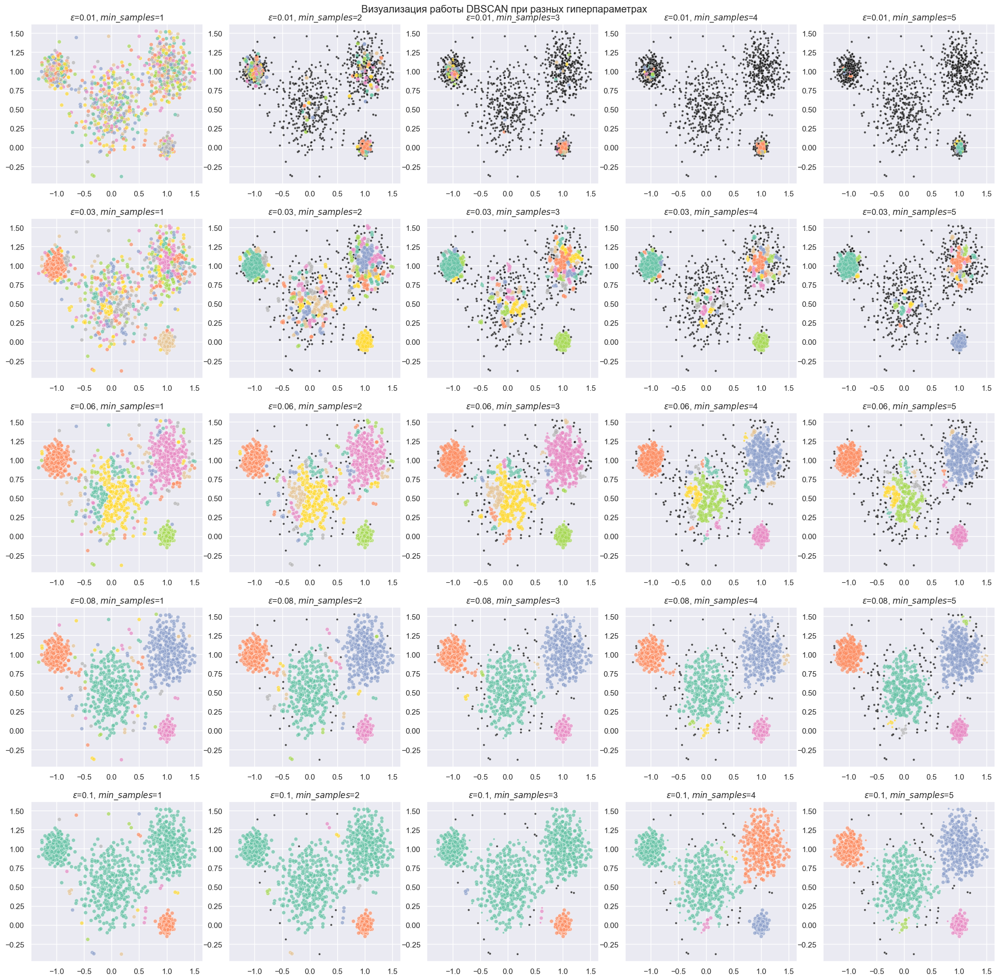

In [7]:
# Сетка параметров
eps_grid = np.linspace(0.01, 0.1, 5)
min_samples_grid = np.arange(1, 6)

fig = plt.figure(figsize=(20, 20))
fig.suptitle("Визуализация работы DBSCAN при разных гиперпараметрах")

for i, eps in enumerate(eps_grid):
    for j, min_samples in enumerate(min_samples_grid):
        # Предсказываем кластеры
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(data)

        # Визуализируем
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.title(f"$\\varepsilon$={np.round(eps, 2)}, $min\_samples$={min_samples}")
        visualize_dbscan_predicts(dbscan, legend=False, scale_sizes=1)

plt.tight_layout()
plt.show()

Видим, что при некоторых параметрах (например, `eps = 0.08` и `min_samples=5`) DBSCAN справился неплохо. Но и не идеально: нет ни одной комбинации при которой бы было ровно 4 кластера близкие к правильным, везде есть какие-то дополнительные микрокластеры.

### 4. Сравнение методов

Теперь сравним работу методов на двух других интересных синтетических датасетах и поймем в каком случае какой метод лучше использовать.

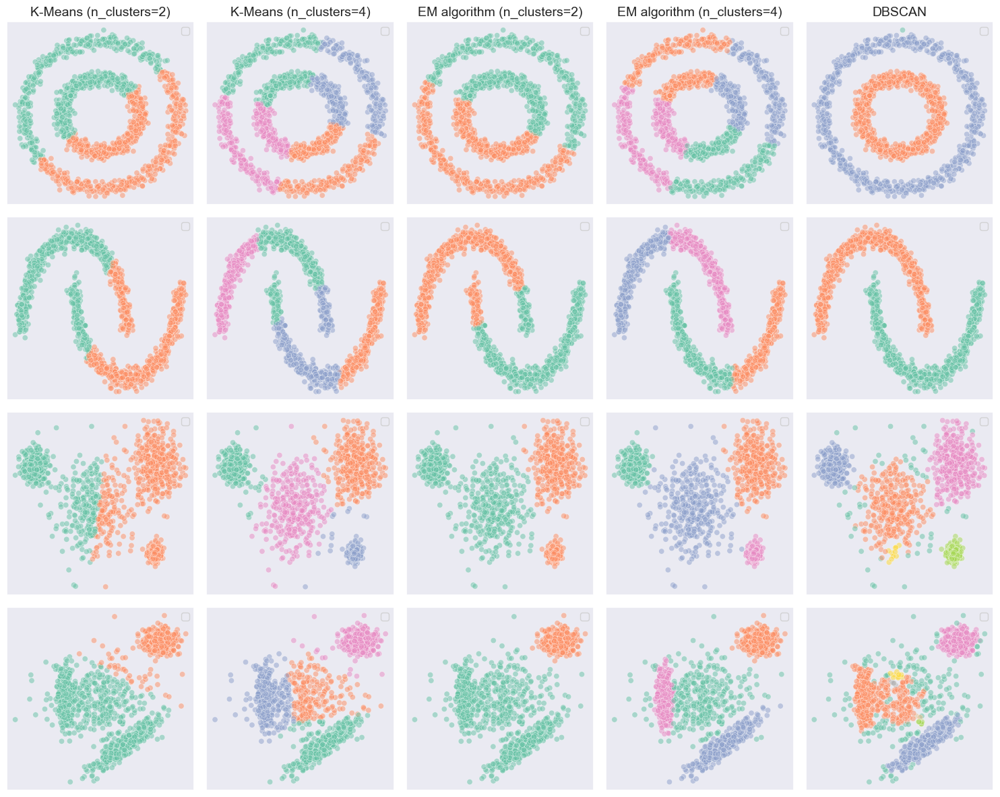

In [38]:
# Генерируем недостающие данные
n_samples = 1500
noisy_circles, _ = sklearn.datasets.make_circles(
    n_samples=n_samples, factor=0.5, noise=0.05, random_state=42
)
noisy_moons, _ = sklearn.datasets.make_moons(
    n_samples=n_samples, noise=0.05, random_state=42
)
ellipses = (
    np.concatenate(
        [
            sps.multivariate_normal(mean=[0, 0], cov=[[0.1, 0], [0, 2.0]]).rvs(
                n // 4, random_state=42
            ),
            sps.multivariate_normal(mean=[5, -5], cov=[[2.0, 1.8], [1.8, 2.0]]).rvs(
                n // 4, random_state=42
            ),
            sps.multivariate_normal(mean=[8, 6], cov=[[0.5, 0], [0, 0.5]]).rvs(
                n // 4, random_state=42
            ),
            sps.multivariate_normal(mean=[3, 0], cov=[[5, 0], [0, 5]]).rvs(
                n // 4, random_state=42
            ),
        ]
    )
    / 4
)


# Визуализируем
plt.figure(figsize=(15, 12))
plot_idx = 1
dataset_list = [noisy_circles, noisy_moons, data, ellipses]

for i_dataset, dataset in enumerate(dataset_list):
    # Создаем методы кластеризации
    clustering_algorithms = (
        (
            "K-Means (n_clusters=2)",
            KMeans(n_clusters=2, n_init="auto", random_state=42),
        ),
        (
            "K-Means (n_clusters=4)",
            KMeans(n_clusters=4, n_init="auto", random_state=42),
        ),
        (
            "EM algorithm (n_clusters=2)",
            GaussianMixture(n_components=2, n_init=10, random_state=42),
        ),
        (
            "EM algorithm (n_clusters=4)",
            GaussianMixture(n_components=4, n_init=10, random_state=42),
        ),
        ("DBSCAN", dbscan),
    )

    for name, algorithm in clustering_algorithms:
        # Делаем предсказания
        predict_labels = algorithm.fit_predict(dataset)

        # Строим график точек и предсказанных меток
        plt.subplot(len(dataset_list), len(clustering_algorithms), plot_idx)
        if i_dataset == 0:
            plt.title(name, size=14)

        sns.scatterplot(
            x=dataset[:, 0],
            y=dataset[:, 1],
            hue=predict_labels,
            alpha=0.5,
            palette="Set2",
        )

        plt.legend(())
        plt.xticks(())
        plt.yticks(())
        plot_idx += 1

plt.tight_layout()
plt.show()

На графике видны, существенные различия в результатах кластеризации, полученных с помощью разных методов. Исходя из контекста исследования, один метод может быть предпочтительнее другого.

Например, если взглянуть на первые два набора данных, можно предположить, что DBSCAN справляется гораздо лучше, чем методы k-means и EM-алгоритм, выделяя структуры данных более четко. Однако в случае, когда расстояние по оси X коррелирует с реальным физическим свойством и удаленность точек указывает на их непохожесть (как, скажем, площадь квартиры), k-means и EM-алгоритм на четырех классах, могут давать более подходящую кластеризацию.

Также отметим особенность последнего набора данных. Здесь видно, что EM-алгоритм может формировать невыпуклые кластеры, обычно это не очень хорошо и плохо интерпретируется. В отличие от него, k-means всегда создает выпуклые кластеры. К тому же, EM-алгоритм обладает гораздо большим количеством обучаемых параметров, так как он не только оценивает среднее для каждого кластера, но и подбирает дисперсии кластеров и вероятности принадлежности каждой точки к определенному кластеру, что добавляет дополнительную сложность и может привести к переобучению.


### 5. Кластеризация ответов в бот

В этом разделе проведем анализ ваших ответов на вопросы в бот. Для этого с помощью нейросети будем предсказывать эмбеддинги ответов и затем кластеризуем их k-means.

#### 5.1 Кластеризация ответов на вопрос "*Понравились ли вам нейросети?*"

Попробуем поискать какие-то закономерности в ответах на вопрос про нейросети за 2022 и 2024 года. 


Загружаем ответы:

In [2]:
like_nn_answers = pd.read_csv("data/like_neuralnet_question.csv")
like_nn_answers

,answer,question,year
0,"Одной минуты мало, чтобы выразить весь спектр эмоций)",Вам понравились нейронные сети?,2022
1,"Да, Лиза Дахова самый классный лектор по ад)",Вам понравились нейронные сети?,2022
2,Да ❤️‍🔥 (возьмите на кафедру пожалуйста),Вам понравились нейронные сети?,2022
3,Я бьюсь в экстазе!!!1!!1!,Вам понравились нейронные сети?,2022
4,"Как искусственный интеллект, я не обладаю личными предпочтениями или эмоциями, поэтому мне не да...",Вам понравились нейронные сети?,2024
...,...,...,...
292,"ДА, ОЧЕНЬ ПОНРАВИЛОСЬ, Я ХОЧУ ОТ НИХ ДЕТЕЙ",Вам понравились нейронные сети?,2024
293,"Ну прикольно, но мне не нравится python, так, что такое, но таки норм норм 😎🫨",Вам понравились нейронные сети?,2024
294,Setting pad_token_id to eos_token_id: 50257 for open-end generation,Вам понравились нейронные сети?,2024
295,"Главное, чтобы я понравилась им🙈",Вам понравились нейронные сети?,2024


Теперь загружаем из huggingface обученную модель с соответствующим токенизатором <a target="_blank" href="https://huggingface.co/intfloat/multilingual-e5-small">intfloat/multilingual-e5-small</a> для получения эмбеддингов текста

In [3]:
import torch.nn.functional as F

import torch
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer


def average_pool(last_hidden_states, attention_mask):
    last_hidden = last_hidden_states.masked_fill(~attention_mask[..., None].bool(), 0.0)
    return last_hidden.sum(dim=1) / attention_mask.sum(dim=1)[..., None]


tokenizer = AutoTokenizer.from_pretrained("intfloat/multilingual-e5-small")
model = AutoModel.from_pretrained("intfloat/multilingual-e5-small")

Предсказываем эмбеддинги ответов

In [4]:
def make_embeddings(texts, model, tokenizer=None, batch_size=16):
    """
    Считает эмбеддинги текстов из массива texts

    :param texts: массив текстов
    :param model: модель для вычисления эмбеддингов
    :param tokenizer: токенизатор, соответствующий модели
    :param batch_size: размер батча при генерации эмбеддингов
    """
    text_embeddings = []

    for start_batch_idx in tqdm(range(0, len(texts), batch_size)):
        # Выбранная модель была обучена на входах, начинающихся с "query:" или "passage:".
        # Поэтому ко всем ответам надо добавить префикс "query:"
        input_texts = [
            "query: " + text
            for text in texts[start_batch_idx : start_batch_idx + batch_size]
        ]

        # Токенизируем тексты
        batch_dict = tokenizer(
            input_texts,
            max_length=512,
            padding=True,
            truncation=True,
            return_tensors="pt",
        )

        # Применяем модель
        with torch.no_grad():
            outputs = model(**batch_dict)

        # Агрегируем выходы в эмбеддинги и нормализуем их
        embeddings = average_pool(
            outputs.last_hidden_state, batch_dict["attention_mask"]
        )
        embeddings = F.normalize(embeddings, p=2, dim=1)
        text_embeddings.append(embeddings)

    return torch.cat(text_embeddings).cpu().numpy()


like_nn_embeddings = make_embeddings(
    like_nn_answers["answer"], model=model, tokenizer=tokenizer, batch_size=16
)

  0%|          | 0/19 [00:00<?, ?it/s]

Теперь применяем k-means на полученных эмбеддингах, будем разбивать на 4 кластера

In [5]:
# Делаем кластеризацию
kmeans = KMeans(n_clusters=4, n_init=20, random_state=42)
like_nn_clusters = kmeans.fit_predict(like_nn_embeddings)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Для визуализации полученных эмбеддингов спроецируем их на двумерное пространство с помощью PCA. Цветом покажем предсказанный кластер

In [6]:
# Делаем проекцию
pca = PCA(n_components=2)
like_nn_projection = pca.fit_transform(like_nn_embeddings)

# Интерактивная визуализация
fig = px.scatter(
    x=like_nn_projection[:, 0],
    y=like_nn_projection[:, 1],
    hover_name=like_nn_clusters,
    hover_data={"answer": like_nn_answers["answer"]},
    color=like_nn_clusters.astype(str),
    width=1000,
    height=800,
    title="PCA проекция эмбеддингов ответов на вопрос "
    '"Вам понравились нейронные сети?" на двумерное пространство',
    size=[1] * len(like_nn_answers),
    size_max=10,
)
fig.show()

Получилось довольно неплохое разделение:
- **Фиолетовый кластер**: очень короткие ответы "Да".
- **Зеленый кластер**: короткие отрицательные, нейтральные или трешовые ответы.
- **Красный кластер**: средней длины положительные ответы.
- **Синий кластер**: очень подробные преимущественно положительные ответы.

Для наглядности посмотрим на топ-5 типичных ответа для каждого кластера, где под типичностью имеется ввиду близость к центру масс.

In [7]:
cluster_names = [
    "Очень подробные преимущественно положительные ответы",
    'Очень короткие ответы "Да"',
    "Короткие отрицательные, нейтральные или трешовые ответы",
    "Средней длины положительные ответы",
]

for cluster in np.unique(like_nn_clusters):
    cluster_points = like_nn_projection[like_nn_clusters == cluster]
    cluster_answers = like_nn_answers.loc[like_nn_clusters == cluster, "answer"]

    # Находим центр кластера
    cluster_center = cluster_points.mean(axis=0)
    # Считаем расстояния до центра от каждой точки кластера
    distances = np.linalg.norm(cluster_center - cluster_points, axis=1)
    # Сортируем расстояния и берем индексы в порядке возрастания расстояний
    closest_idxs = np.argsort(distances)
    # Берем топ-5 уникальных ответов, соответствующих полученным индексам
    closest_answers = cluster_answers.iloc[closest_idxs].drop_duplicates()[:5]

    print(f"{cluster_names[cluster]}:")
    for i, ans in enumerate(closest_answers):
        print(f"    {i}. {ans}")
    print()

Очень подробные преимущественно положительные ответы:
    0. Если честно, на этот курс я пришёл ради статов, чтобы лучше работать аб-тесты. Ну впринципе прикольненько)
    1. Да это полезная вещь, с ее помощью можно решать полезные задачи, но тяжелая математика и обучать
    2. Относительно да. Мне нравится их применение, но совсем не нравится их математическая модель.
    3. Да!!!❤❤❤ Очень понравилось 😘👍❤️🐱. НЕЙРОНЫЕ СЕТИ ЛУЧШИН!)))))
хочу пояаще обучаться таклиу😙
    4. В первом приближении звучит местами интересно, но стоит в дальнейшем приглядеться

Очень короткие ответы "Да":
    0. да
    1. Да
    2. ДА!
    3. ДА
    4. Да)

Короткие отрицательные, нейтральные или трешовые ответы:
    0. Сети - да, математика на доске - нет
    1. +inf
    2. Перцептрон?
    3. Перцептрон!
    4. Наверное

Средней длины положительные ответы:
    0. Да, очень) Узнал много нового
    1. Позвольте ответить песней: Да!
Спасибо за внимание
    2. Да, очень, возьмите на DS-поток пожалуйста
    3. Да,

#### 5.2 Кластеризация ответов на тестовый вопрос

Теперь посмотрим на тестовый вопрос, который в разные годы звучал по-разному:

* 2022: "*Первый тестовый вопрос*"
* 2023: "*Первый тестовый вопрос. Напиши что-то текстом и отправь боту.*"
* 2024: "*Первый тестовый вопрос. Поприветствуй бота и расскажи ему что-нибудь о себе.*"

In [8]:
test_answers = pd.read_csv("data/test_question.csv")
test_answers

,answer,question,year
0,абоба,Первый тестовый вопрос,2022
1,🎩\n🐸\n👕\n👖,Первый тестовый вопрос,2022
2,Спасибо за курс) Ожидаю что-то интересное,Первый тестовый вопрос,2022
3,Крекеры — топ,Первый тестовый вопрос,2022
4,Ответ на тестовый вопрос,Первый тестовый вопрос,2022
...,...,...,...
577,Добрый вечер! Я недавно закрыла матан!!!!!!,Первый тестовый вопрос. Поприветствуй бота и расскажи ему что-нибудь о себе,2024
578,"Приветствую. Сегодня прекрасный день, чтобы начать ботать)))\nХочу отл",Первый тестовый вопрос. Поприветствуй бота и расскажи ему что-нибудь о себе,2024
579,Привет)\nНемного о себе.\nГений. Миллиардер. Плейбой. Филантроп.,Первый тестовый вопрос. Поприветствуй бота и расскажи ему что-нибудь о себе,2024
580,"Привет, я студент курса анализа данных и хочу на ДС поток",Первый тестовый вопрос. Поприветствуй бота и расскажи ему что-нибудь о себе,2024


Как и в прошлый раз считаем эмбеддинги, делаем кластеризацию и проецируем на двумерное пространство

In [18]:
# Считаем эмбеддинги
test_embeddings = make_embeddings(
    test_answers["answer"], model=model, tokenizer=tokenizer, batch_size=16
)

# Делаем кластеризацию
kmeans = KMeans(n_clusters=5, n_init=20, random_state=42)
test_clusters = kmeans.fit_predict(test_embeddings)

# Делаем проекцию
pca = PCA(n_components=2)
test_projection = pca.fit_transform(test_embeddings)

  0%|          | 0/37 [00:00<?, ?it/s]

In [19]:
# Интерактивная визуализация
fig = px.scatter(
    x=test_projection[:, 0],
    y=test_projection[:, 1],
    hover_name=test_clusters,
    hover_data={"answer": test_answers["answer"]},
    color=test_clusters.astype(str),
    width=1000,
    height=800,
    title="PCA проекция эмбеддингов ответов на тестовый вопрос на двумерное пространство",
    size=[1] * len(test_answers),
    size_max=10,
)
fig.show()

Итак, видим тоже довольно логичные кластеры:
- **Оранжевый кластер**: короткий приветственный ответ.
- **Зеленый кластер**: относительно длинные ответы с рассказом про себя.
- **Фиолетовый кластер**: короткие ответы, содержащие слово "ответ" или "тест".
- **Синий кластер**: трешовые ответы на кириллице.
- **Красный кластер**: трешовые ответы на латинице, эмодзи или цифры.

Как и ранее посмотрим на топ-5 типичных ответов каждого кластера:

In [21]:
cluster_names = [
    'Короткие ответы, содержащие слово "ответ" или "тест"',
    "Короткий приветственный ответ",
    "Трешовые ответы на кириллице",
    "Трешовые ответы на латинице, эмодзи или цифры",
    "Относительно длинные ответы с рассказом про себя",
]

for cluster in np.unique(test_clusters):
    cluster_points = test_projection[test_clusters == cluster]
    cluster_answers = test_answers.loc[test_clusters == cluster, "answer"]

    # Находим центр кластера
    cluster_center = cluster_points.mean(axis=0)
    # Считаем расстояния до центра от каждой точки кластера
    distances = np.linalg.norm(cluster_center - cluster_points, axis=1)
    # Сортируем расстояния и берем индексы в порядке возрастания расстояний
    closest_idxs = np.argsort(distances)
    # Берем топ-5 уникальных ответов, соответствующих полученным индексам
    closest_answers = cluster_answers.iloc[closest_idxs].drop_duplicates()[:5]

    print(f"{cluster_names[cluster]}:")
    for i, ans in enumerate(closest_answers):
        print(f"    {i}. {ans}")
    print()

Короткие ответы, содержащие слово "ответ" или "тест":
    0. Другой ответ
    1. какой ответ
    2. изменение ответа
    3. Ответ.
    4. снова ответ

Короткий приветственный ответ:
    0. Привет)
    1. Привет ((
    2. Привет!
    3. Привет
    4. Привет.

Трешовые ответы на кириллице:
    0. Яхаааапаа
    1. Дадабо
    2. Рамзан
    3. Максим
    4. Лольк

Трешовые ответы на латинице, эмодзи или цифры:
    0. Salamaleikum
    1. ahahhaa
    2. Amogus
    3. Cccc
    4. Ggg

Относительно длинные ответы с рассказом про себя:
    0. Привет. Я снова здесь, могу этот курс перепачкать с прошлого раза, но интересно еще раз послушать
    1. Спасибо за курс) Ожидаю что-то интересное
    2. Добрый вечер! Я недавно закрыла матан!!!!!!
    3. Привет! Я Мавджуда из 253й группы
    4. Привет! Учусь на ПМИ.Классика, играю в хоккей 🏒



#### 5.3 Кластеризация ответов на вопрос про кластеризацию

И наконец посмотрим ответы на вопрос, заданный вам пару часов назад:

> *Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри кластеров выявить успешные магазины, определить для остальных магазинов в кластере точки роста.*
>
> *Вопрос: как кластеризовать, как измерить качество?*
>
> *Напиши результат обсуждения в команде (для каждого студента из команды)*

In [134]:
def add_new_lines(text):
    words = text.split(" ")
    new_text = ""

    for start_idx in range(0, len(words), 12):
        new_text += " ".join(words[start_idx : start_idx + 12]) + "<br>"

    return new_text.replace("\n", "<br>")


new_answers = pd.read_csv("data/new_question.csv")

# Добавляем переносы строк каждые 12 слов для удобной визуализации
# (при построении эмбеддингов используем нормальные ответы)
new_answers["answer_new_lines"] = new_answers["answer"].apply(add_new_lines)
new_answers

,answer,question,answer_new_lines
0,"Для кластеризации магазинов можно воспользоваться алгоритмами машинного обучения, такими как k-m...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Для кластеризации магазинов можно воспользоваться алгоритмами машинного обучения, такими как k-m..."
1,1) Кластеров должно быть не очень много и не очень мало\n2) Кластеры должны отражать близость ма...,"Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...",1) Кластеров должно быть не очень много и не очень мало<br>2) Кластеры<br>должны отражать близос...
2,"Кодируем признаки (кроме первых двух, выручка и потери являются мерой успеха), стандартизируем и...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Кодируем признаки (кроме первых двух, выручка и потери являются мерой успеха), стандартизируем<b..."
3,"1.Определим критерии для кластеризации. Это могут быть продажи, площадь магазина, количество сот...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","1.Определим критерии для кластеризации. Это могут быть продажи, площадь магазина, количество сот..."
4,"Сначала выберем значимые признаки: продажи и выпуска, площадь зала, торговые центры рядом, плотн...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Сначала выберем значимые признаки: продажи и выпуска, площадь зала, торговые центры рядом,<br>пл..."
...,...,...,...
132,"Метод k-средних (k-means) - это алгоритм кластерного анализа, который используется для разделени...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Метод k-средних (k-means) - это алгоритм кластерного анализа, который используется для разделени..."
133,"Делаем кластеризацию по всем признакам, признаки с наибольшем весом - трафик, площадь, выручка з...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Делаем кластеризацию по всем признакам, признаки с наибольшем весом - трафик, площадь,<br>выручк..."
134,"Кластеризовать супермаркеты можно по окружению, их характеристикам. вроде размера и количества с...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Кластеризовать супермаркеты можно по окружению, их характеристикам. вроде размера и количества с..."
135,"Кластеризовать используя Kmeans, каждый раз соединять наиболее близкие магазины в 1 класер, пока...","Имеется несколько тысяч супермаркетов. Цель: кластеризовать магазины по похожести, внутри класте...","Кластеризовать используя Kmeans, каждый раз соединять наиболее близкие магазины в 1 класер,<br>п..."


In [135]:
# Считаем эмбеддинги
new_embeddings = make_embeddings(
    new_answers["answer"], model=model, tokenizer=tokenizer, batch_size=16
)

# Делаем проекцию
pca = PCA(n_components=2)
new_projection = pca.fit_transform(new_embeddings)

  0%|          | 0/9 [00:00<?, ?it/s]

Делаем кластеризацию:

In [142]:
pca = PCA(n_components=10)
projection = pca.fit_transform(new_embeddings)

kmeans = KMeans(n_clusters=5, n_init=10, random_state=42)
new_clusters = kmeans.fit_predict(projection)

Визуализируем:

In [143]:
# Интерактивная визуализация
fig = px.scatter(
    x=new_projection[:, 0],
    y=new_projection[:, 1],
    hover_name=new_clusters,
    hover_data={"answer": new_answers["answer_new_lines"]},
    color=new_clusters.astype(str),
    width=1000,
    height=800,
    title="PCA проекция эмбеддингов ответов на новые вопросы на двумерное пространство",
    size=[1] * len(new_answers),
    size_max=10,
)
fig.show()

- **Синий кластер**: расписано более подробно как и с помощью каких методов кластеризовать (часто встречаются такие слова как k-means, dbscan, hierarchical clustering, PCA).
- **Фиолетовый кластер**: в ответах обычно содержится список физических признаков, по которым можно делать кластеризацию.
- **Красный кластер**: ответы в виде списка пунктов.
- **Зеленый кластер**: похож на синий кластер, но менее подробное описание, без приведения примеров конкретных методов.
- **Оранжевый кластер**: мяу, restart и соня🙃

In [145]:
cluster_names = [
    "Расписано чуть более подробно как и с помощью каких методов кластеризовать (часто встречаются такие слова как k-means, dbscan, hierarchical clustering, PCA)",
    "В ответах обычно содержится список физических признаков, по которым можно делать кластеризацию",
    "Ответы в виде списка пунктов",
    "Похож на синий кластер, но менее подробное описание, без приведения примеров конкретных методов",
    "Мяу, restart и соня🙃",
]

for cluster in np.unique(new_clusters):
    cluster_points = new_projection[new_clusters == cluster]
    cluster_answers = new_answers.loc[new_clusters == cluster, "answer"]

    # Находим центр кластера
    cluster_center = cluster_points.mean(axis=0)
    # Считаем расстояния до центра от каждой точки кластера
    distances = np.linalg.norm(cluster_center - cluster_points, axis=1)
    # Сортируем расстояния и берем индексы в порядке возрастания расстояний
    closest_idxs = np.argsort(distances)
    # Берем топ-5 уникальных ответов, соответствующих полученным индексам
    closest_answers = cluster_answers.iloc[closest_idxs].drop_duplicates()[:5]

    print(f"{cluster_names[cluster]}:")
    for i, ans in enumerate(closest_answers):
        print(f"    {i}. {ans}\n" + "-" * 10)
    print("\n\n" + "-" * 100 + "\n")

Расписано чуть более подробно как и с помощью каких методов кластеризовать (часто встречаются такие слова как k-means, dbscan, hierarchical clustering, PCA):
    0. Для кластеризации магазинов можно использовать методы машинного обучения, такие как k-means или hierarchical clustering.

Предлагаю использовать алгоритм k-means для кластеризации магазинов, так как он хорошо работает с большими объемами данных.

Общее согласие в команде было достигнуто по использованию k-means для кластеризации, индекса Дэвиса-Болдина для оценки качества, а также на необходимость учета бизнес-контекста при определении успешности и точек роста магазинов.
----------
    1. Для решения задачи кластеризации супермаркетов, мы можем использовать метод k-средних или иерархическую кластеризацию. Выбор метода зависит от количества переменных и их типов. В качестве входных данных могут использоваться различные показатели эффективности работы магазина, такие как выручка, количество посетителей, средний чек и другие.
